# Object Detection - Faster RCNN

In [1]:
!pip3 install tensorflow-estimator==2.6.0

In [2]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈 
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile 
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

In [3]:
# 이미지 시각화 함수
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

In [4]:
# 원하는 이미지 다운로드 & 리사이징 함수 정의
def download_and_resize_image(url, new_width=256, new_height=256, display=False): 
  
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

In [5]:
# bounding box 만드는 함수 정의
def draw_bounding_box_on_image(image, 
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

In [6]:
# 이미지 위에 class 이름과 score 나타내는 함수 정의
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1): 
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

Image downloaded to /tmp/tmppnv248vg.jpg.


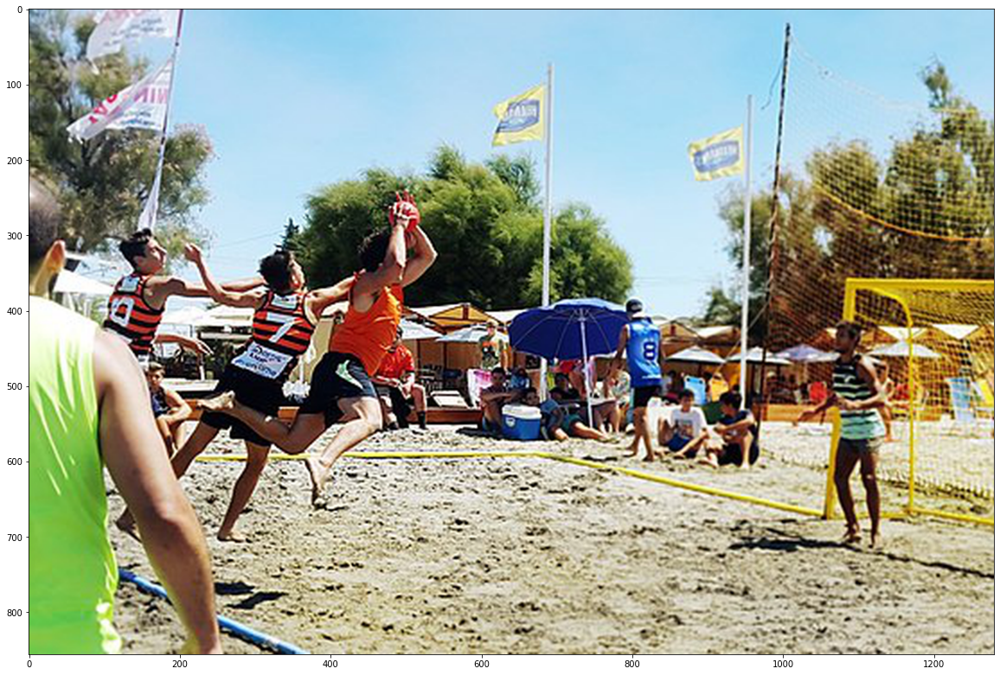

In [7]:
# 이미지 불러오기
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

In [8]:
# tfhub에서 사전 학습된 faster RCNN 모델 불러오기
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"  

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [9]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [10]:
# Detector 함수 정의
def run_detector(detector, path):
  img = load_img(path) 

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

Found 100 objects.
Inference time:  84.38984084129333


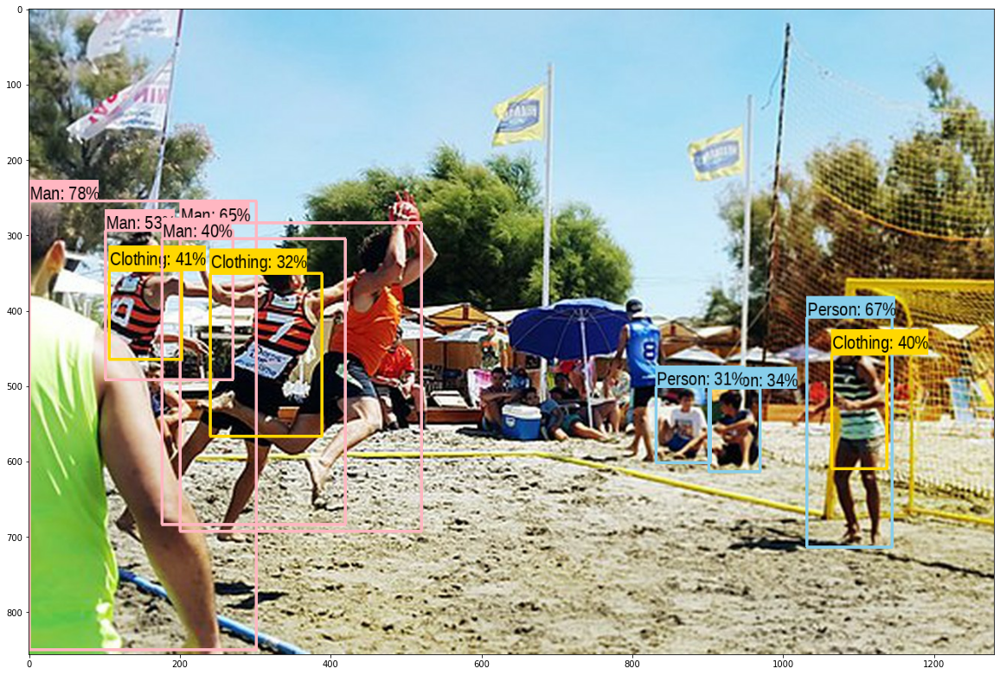

In [11]:
# Detector 함수 실행시켜보기
run_detector(detector, downloaded_image_path)

# 다른 이미지 테스트해보기

Image downloaded to /tmp/tmpjq2b2v7v.jpg.


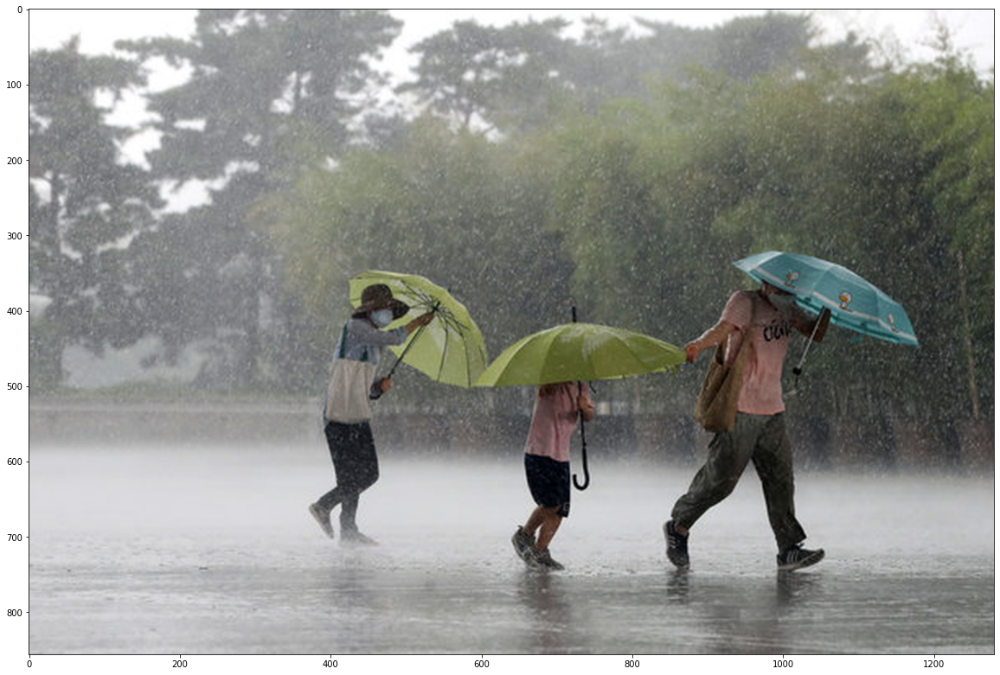

In [13]:
# 이미지 불러오기
image_url = "https://dimg.donga.com/wps/NEWS/IMAGE/2021/07/03/107768167.2.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  1.3982927799224854


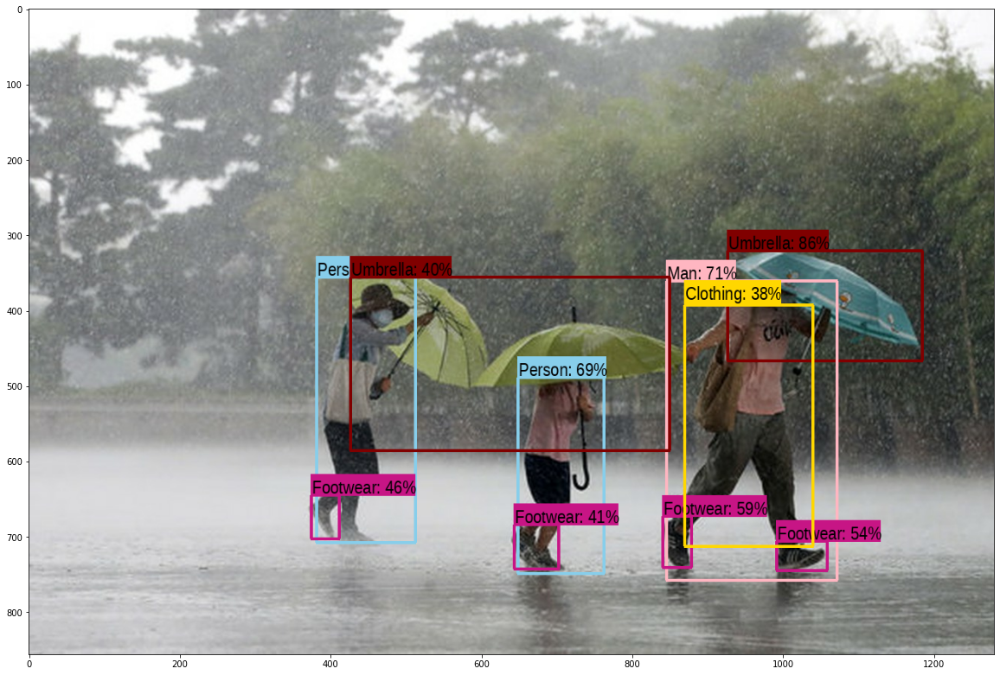

In [14]:
# 디텍터 실행
run_detector(detector, downloaded_image_path)

Image downloaded to /tmp/tmpj5oh2e15.jpg.


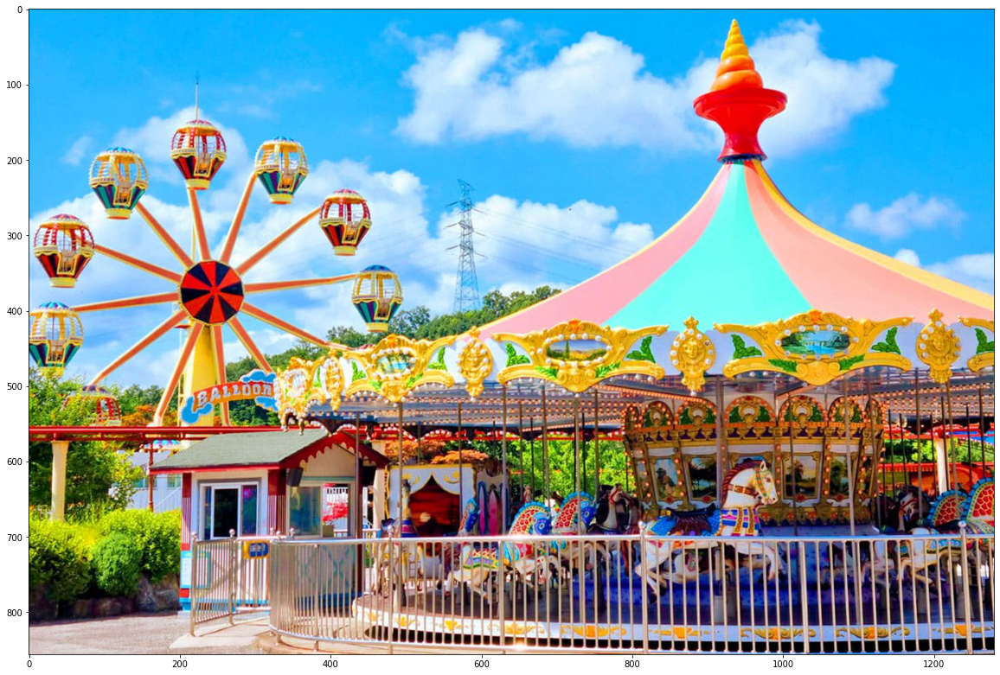

In [16]:
# 이미지 불러오기
image_url = "https://cdn.telltrip.com/news/photo/202403/1378_7517_3347.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  1.3860719203948975


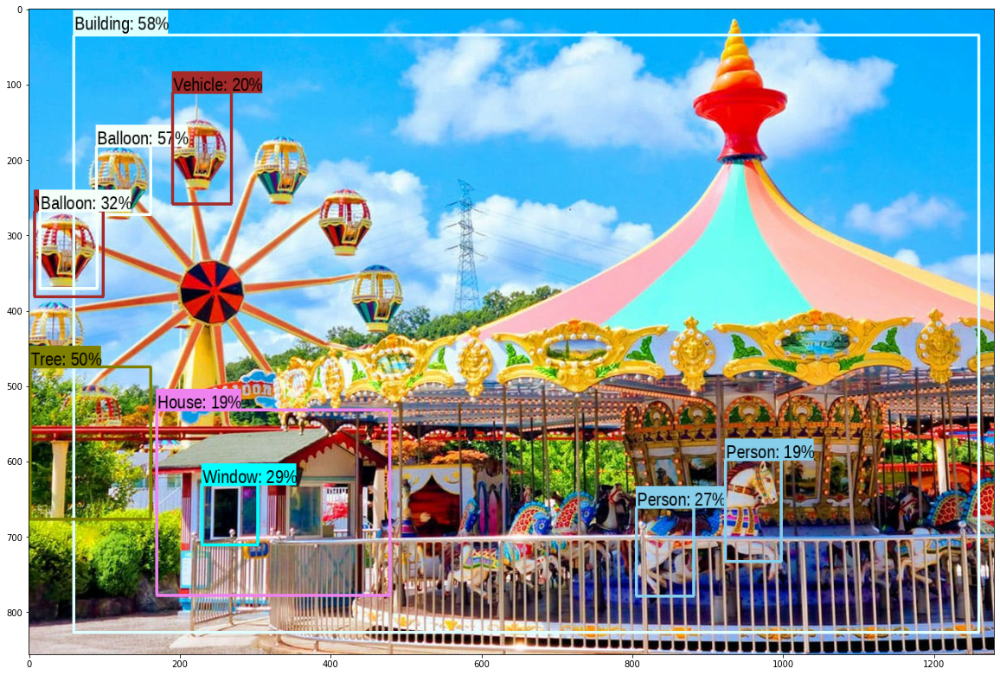

In [17]:
# 디텍터 실행
run_detector(detector, downloaded_image_path)

Image downloaded to /tmp/tmptrkmncyi.jpg.


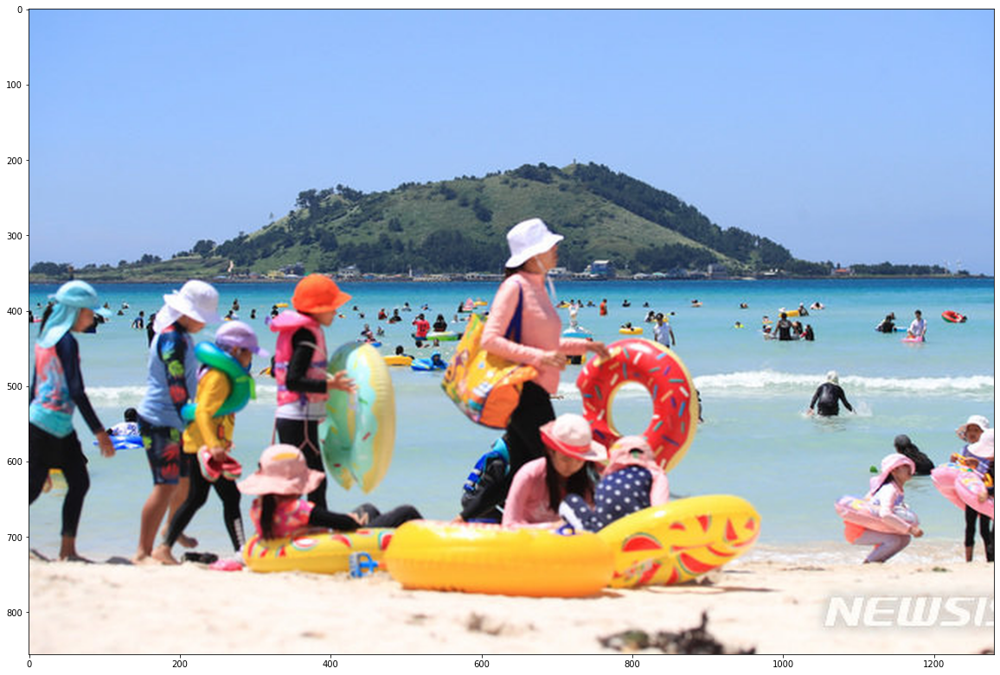

In [18]:
# 이미지 불러오기
image_url = "https://dimg.donga.com/wps/NEWS/IMAGE/2023/05/24/119453054.2.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  1.4092283248901367


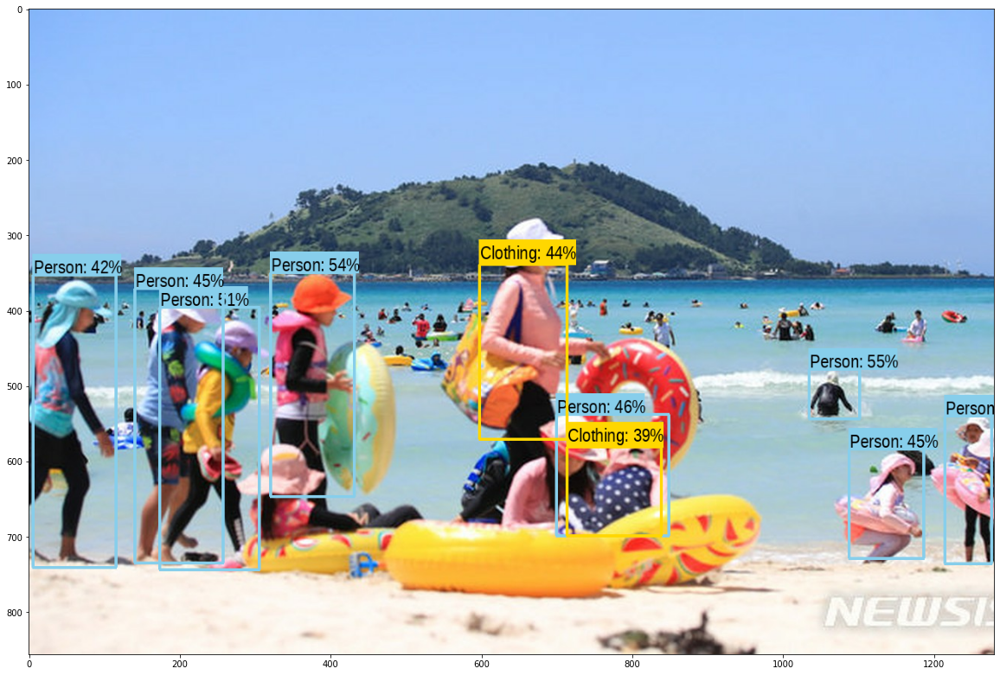

In [19]:
# 디텍터 실행
run_detector(detector, downloaded_image_path)

# 다른 사전 학습 모델 사용해보기

In [76]:
# 필요한 라이브러리 설치 (처음 한 번만 실행)
!pip install torch torchvision
!pip install ultralytics
!pip install opencv-python-headless
!pip install requests

In [78]:
# 필요한 라이브러리 임포트
import torch
import cv2
import requests
import numpy as np
from PIL import Image
from io import BytesIO
from ultralytics import YOLO

In [79]:
# 인터넷 이미지 다운로드 및 전처리 함수
def load_image_from_url(url):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    img = np.array(img)
    if img.shape[2] == 4:  # RGBA 이미지인 경우
        img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)
    return img

In [80]:
# YOLO 모델 로드
model = YOLO('yolov5s.pt')

PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



In [81]:
# 이미지 URL
image_url = "https://dimg.donga.com/wps/NEWS/IMAGE/2021/07/03/107768167.2.jpg"  # 여기에 실제 이미지 URL을 입력하세요

# 이미지 로드 및 객체 탐지
img = load_image_from_url(image_url)
results = model(img)



0: 416x640 3 persons, 2 umbrellas, 1 handbag, 1 surfboard, 22.2ms
Speed: 1.4ms preprocess, 22.2ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)


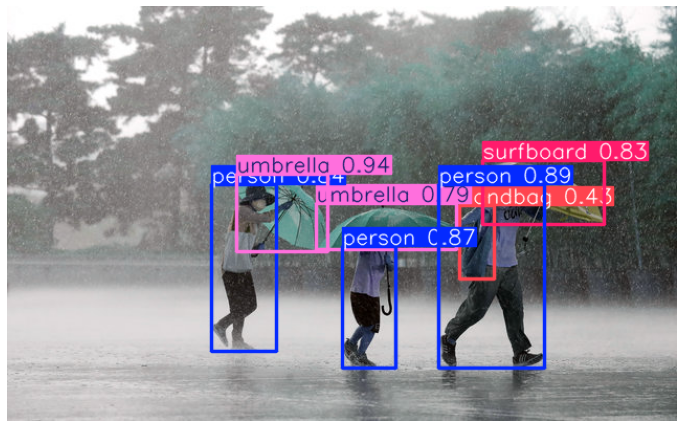

In [82]:
# 결과 시각화
img_with_boxes = results[0].plot()

# 결과 표시
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [83]:
# 탐지된 객체 정보 출력
for result in results:
    print(result.boxes)
    print(result.names)

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([25.,  0.,  0.,  0., 37., 25., 26.], device='cuda:0')
conf: tensor([0.93899, 0.89355, 0.87356, 0.84151, 0.83420, 0.78964, 0.42957], device='cuda:0')
data: tensor([[2.19675e+02, 1.60145e+02, 3.06915e+02, 2.34495e+02, 9.38994e-01, 2.50000e+01],
        [4.12993e+02, 1.70909e+02, 5.13937e+02, 3.45844e+02, 8.93553e-01, 0.00000e+00],
        [3.20036e+02, 2.29439e+02, 3.71807e+02, 3.45298e+02, 8.73556e-01, 0.00000e+00],
        [1.95115e+02, 1.70187e+02, 2.57030e+02, 3.29370e+02, 8.41511e-01, 0.00000e+00],
        [4.54933e+02, 1.47352e+02, 5.70705e+02, 2.08164e+02, 8.34203e-01, 3.70000e+01],
        [2.95832e+02, 1.88612e+02, 4.29777e+02, 2.32995e+02, 7.89644e-01, 2.50000e+01],
        [4.32219e+02, 1.90664e+02, 4.65361e+02, 2.60923e+02, 4.29566e-01, 2.60000e+01]], device='cuda:0')
id: None
is_track: False
orig_shape: (396, 640)
shape: torch.Size([7, 6])
xywh: tensor([[263.29529, 197.32040,  87.23964,  74.34998],
       